# Structure property relationship analysis

This notebook explore the different structure property relationship analysis within the dataset. 

In [3]:
# Import libraries
import pandas as pd
import numpy as np
from pathlib import Path

import seaborn as sns
from matplotlib import pyplot as plt

from func import calc_atomisation_energy

# Reload imported libraries automatically
%load_ext autoreload
%autoreload 2

In [4]:
df = pd.read_csv(".temp/data/compas-2x.csv", index_col=0).query('charge == 0').copy()
lala = pd.read_csv(".temp/data/compas-2x-lala.csv", index_col=0)
df = df.merge(lala[['name','lala', 'stereo', 'types']])

In [5]:
# electronic properties
props = ['homo','lumo','gap','aip','aea','ae'
         ]
props = ['homo_corr','lumo_corr','gap_corr','aip_corr','aea_corr','aepe_corr']
# group by
hue_by = ['rings', 'aromatic_rings', 'atoms', 'heteroatoms', 'heterocycles',
       'branch', 'cyclobutadiene', 'pyrrole', 'borole', 'furan', 'thiophene',
       'dhdiborinine', '14diborinine', 'pyrazine', 'pyridine', 'borinine',
       'benzene', 'h', 'c', 'b', 's', 'o', 'n']

In [6]:
from colors import cmap

In [7]:
import re

def get_longest_anti(s):
    adjacent_anti = re.compile('[AF]+')
    matches = adjacent_anti.findall(s)
    longest = 0
    results = ''
    for m in matches:
        if len(m) > longest:
            longest = len(m)
            results = m
    return longest

def get_longest_helix(s,):
    global direction
    clockwise = re.compile(f'\{direction}+')
    branches = re.compile('\(.+?\)')
    matches = clockwise.findall(s)

    longest = 0
    results = ''
    for m in matches:
        m = branches.sub('', m)
        if len(m) > longest:
            longest = len(m)
            results = m
    return longest


def get_longest_L(s):
    adjacent_ls = re.compile('L+')
    matches = adjacent_ls.findall(s)
    
    longest = 0
    results = ''
    for m in matches:
        if len(m) > longest:
            longest = len(m)
            results = m
    return longest

def get_longest_A(s):
    adjacent_as = re.compile('[TA]+\(.+?\)[TA]+')
    branches = re.compile('\(.+?\)')
    matches = adjacent_as.findall(s)

    longest = 0
    results = ''
    for m in matches:
        m = branches.sub('', m)
        if len(m) > longest:
            longest = len(m)
            results = m
    return longest

df['longest_l'] = df['lala'].apply(get_longest_L)
df['longest_a'] = df['lala'].apply(get_longest_A)

df['longest_anti'] = df['types'].apply(get_longest_anti)

direction = '+'
df['longest_right'] = df['stereo'].apply(get_longest_helix)
direction = '-'
df['longest_left'] = df['stereo'].apply(get_longest_helix)

In [10]:
def plotkde_properties_hued_by(dataset, hue, remove_legend=False, **kwargs):
    fig, axs = plt.subplots(2, 3, figsize=(15, 5))
    axs = axs.flatten()
    for i, prop in enumerate(props):
        sns.kdeplot(data=dataset, x=prop, 
                    fill=True,
                    hue=hue,
                    warn_singular=False,
                    ax=axs[i],
                    **kwargs
                    )
        if remove_legend: axs[i].legend_.remove()
        remove_legend = True
    fig.suptitle(f"Color by {hue}")
    plt.tight_layout()
    return fig, axs

def plothist_properties_hued_by(dataset, hue, remove_legend=False, **kwargs):
    fig, axs = plt.subplots(2, 3, figsize=(15, 5))
    axs = axs.flatten()
    for i, prop in enumerate(props):
        sns.histplot(data=dataset, x=prop, 
                    fill=True,
                    hue=hue,
                    ax=axs[i],
                    **kwargs
                    )
        if remove_legend: axs[i].legend_.remove()
        remove_legend = True
    fig.suptitle(f"Color by {hue}")
    plt.tight_layout()
    return fig, axs
    # fig.savefig(f"properties_hued_by_{hue}.svg", dpi=300)

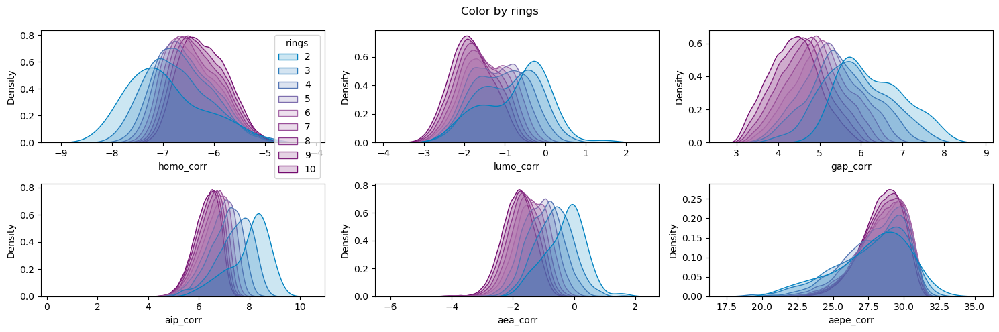

In [20]:
for hue in ['rings']:
    fig = plotkde_properties_hued_by(df, hue,
                    palette=cmap,
                    # edgecolor=None,
                    alpha=0.2,
                    common_norm=False,
                    )

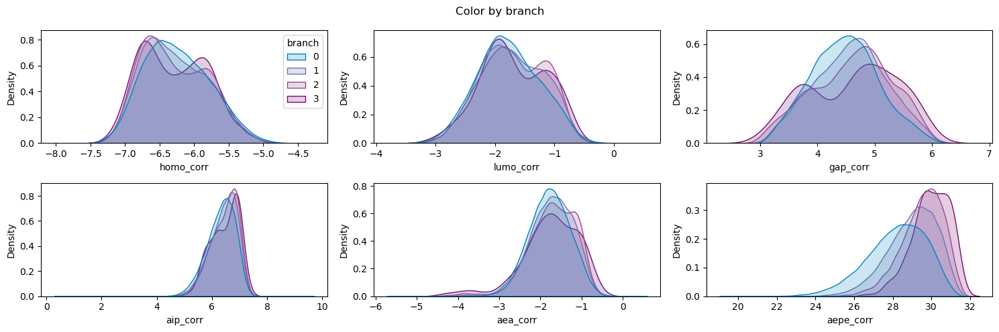

In [22]:
for hue in ['branch']:
    fig = plotkde_properties_hued_by(df.query('rings == 9'), hue, 
                    palette=cmap,
                    alpha=0.2,
                    common_norm=False)

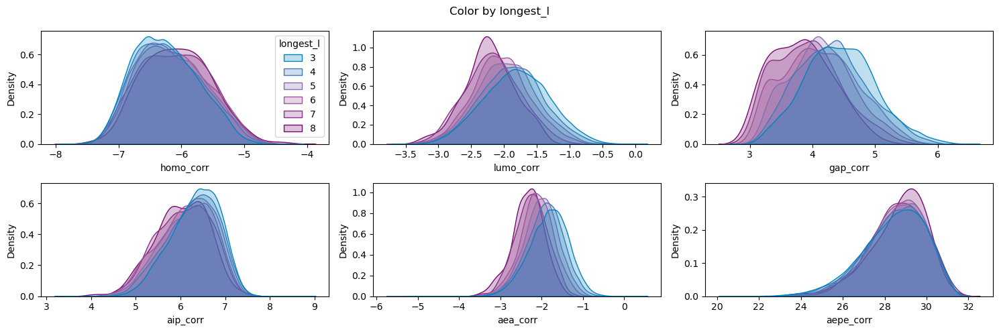

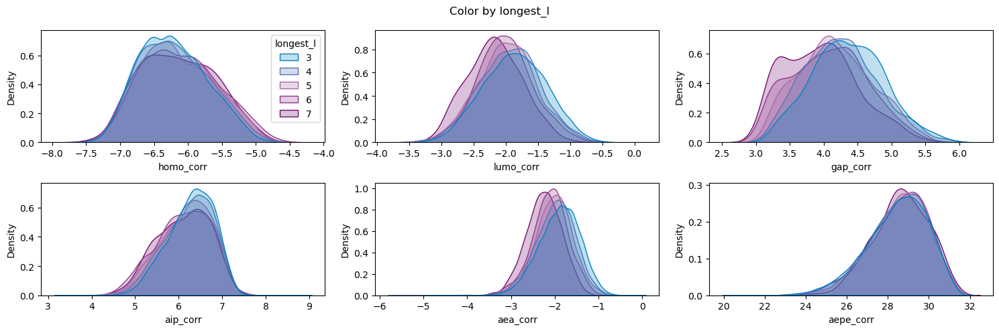

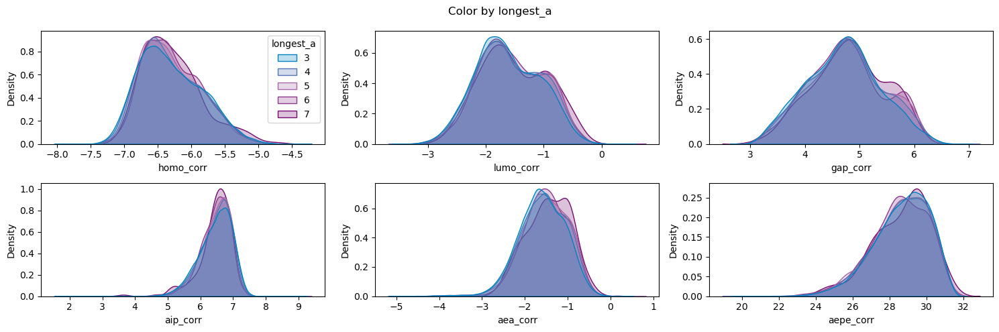

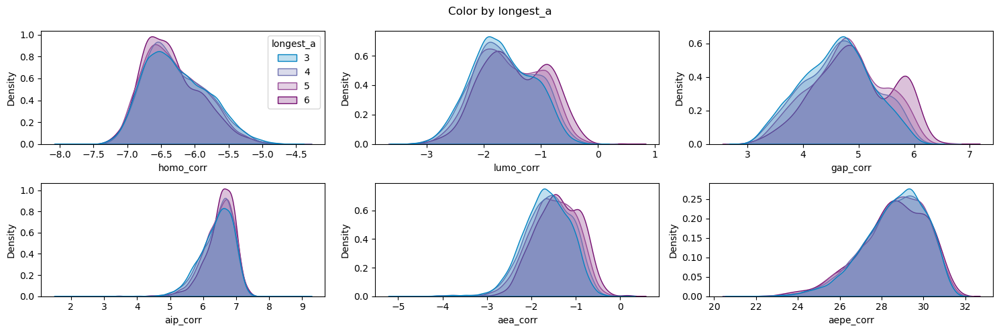

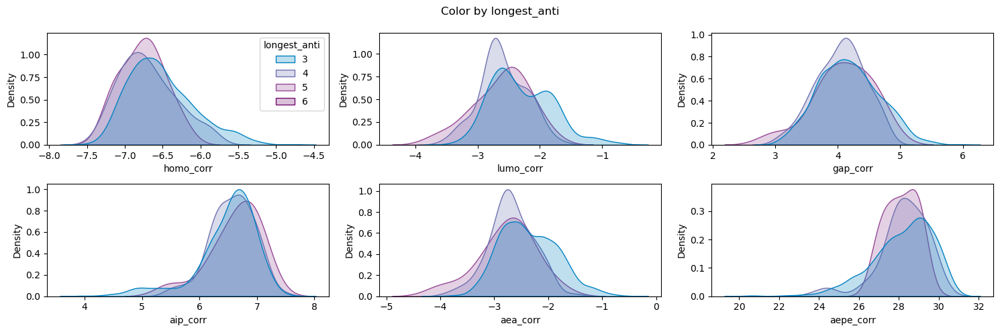

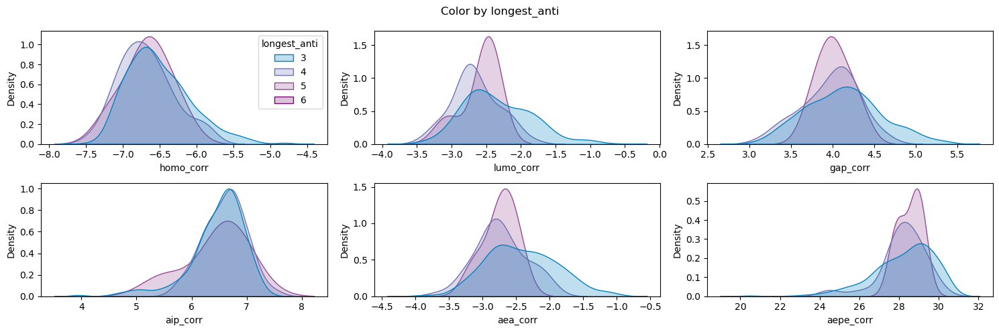

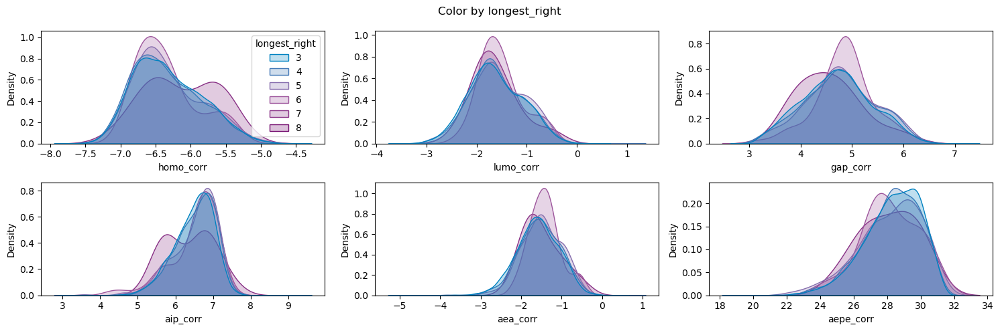

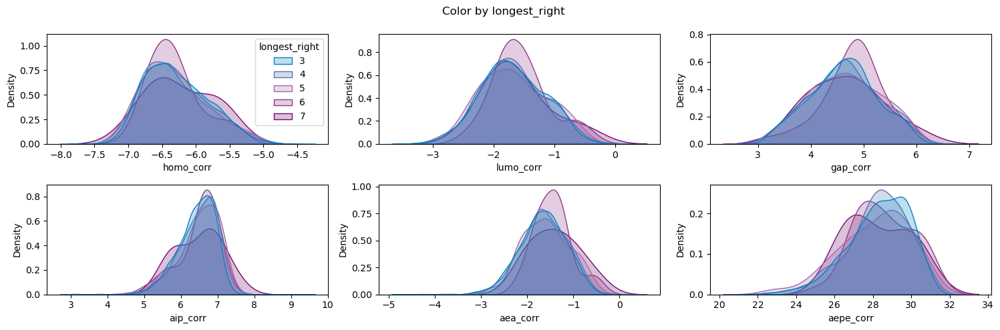

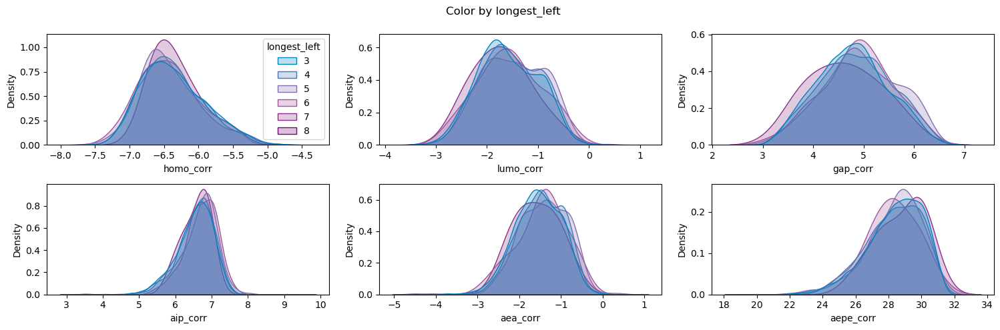

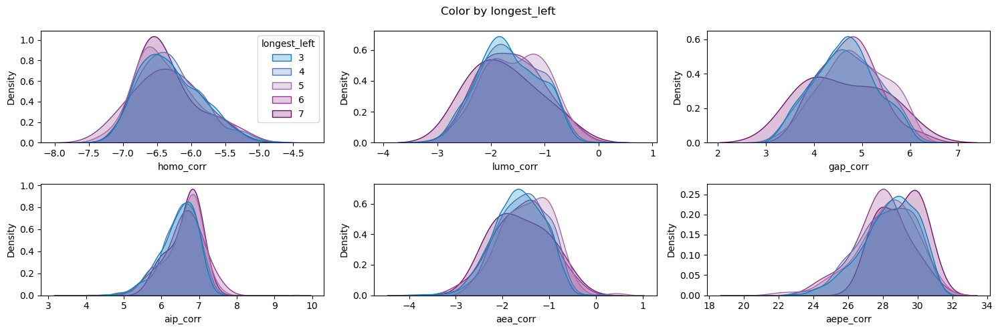

In [122]:
for hue in ['longest_l', 'longest_a', 'longest_anti', 'longest_right', 'longest_left']:
    fig = plot_properties_hued_by(df.query(f'`{hue}` >= 3'), hue,
                    palette=cmap,
                    common_norm=False,)
    fig = plot_properties_hued_by(df.query(f'rings == 9 and `{hue}` >= 3'), hue,
                    palette=cmap,
                    common_norm=False,)

In [23]:
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Draw

In [24]:
def count_pi_electrons(mol: Chem.Mol) -> int:
    # atoms with lonely pairs
    long_pairs_sma = ['[#7H1]','[#8]','[#16]']   
    # count the number of double bonds
    n_double_bonds = sum([bond.GetBondType() == Chem.rdchem.BondType.DOUBLE for bond in mol.GetBonds()])
    # number of pi electrons
    n_pi_electrons = n_double_bonds * 2
    # add the number of electrons from lone pairs
    for sma in long_pairs_sma:
        n_pi_electrons += len(mol.GetSubstructMatches(Chem.MolFromSmarts(sma)))*2
    return n_pi_electrons

def huckel_aromaticity(n_pi_electrons: int) -> bool:
    """
    Returns True if the number of pi electrons is Huckel aromatic (4n+2)
    """
    return (n_pi_electrons - 2) % 4 == 0

def get_huckel_aromaticity_from_mol(mol: Chem.Mol) -> bool:
    # kekulize the molecule to avoid dealing with aromatic bonds
    Chem.Kekulize(mol)
    # count the number of pi electrons
    n_pi_electrons = count_pi_electrons(mol)
    return huckel_aromaticity(n_pi_electrons)

def get_huckel_aromaticity_from_smiles(smi:str) -> bool:
    mol = Chem.MolFromSmiles(smi)
    return get_huckel_aromaticity_from_mol(mol)

def get_pi_electron_from_smiles(smi:str) -> int:
    mol = Chem.MolFromSmiles(smi)
    Chem.Kekulize(mol)
    return count_pi_electrons(mol)

In [25]:
df['huckel'] = df['smiles'].apply(get_huckel_aromaticity_from_smiles)
df['pie'] = df['smiles'].apply(get_pi_electron_from_smiles)

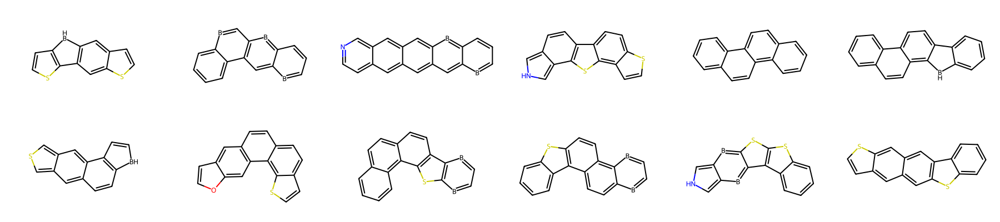

In [99]:
smis = df.query('huckel == True and rings <= 5').iloc[:12]['smiles']
Draw.MolsToGridImage([Chem.MolFromSmiles(smi) for smi in smis], subImgSize=(300,200), molsPerRow=6)

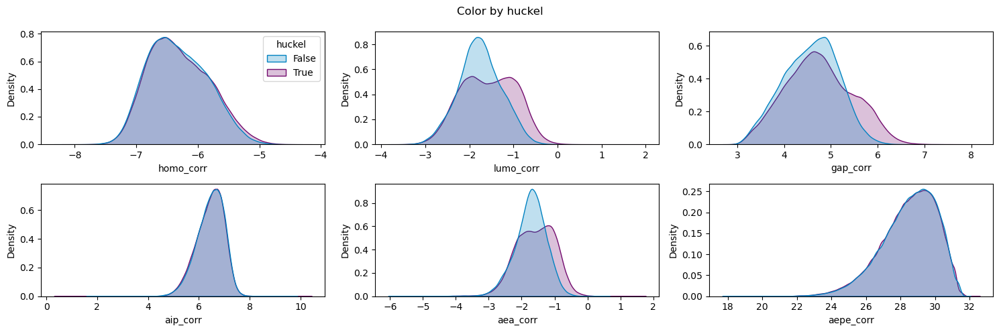

In [123]:
for hue in ['huckel']:
    fig = plot_properties_hued_by(df, hue,
                    palette=['#0082C1','#730B6E'],
                    common_norm=False,)

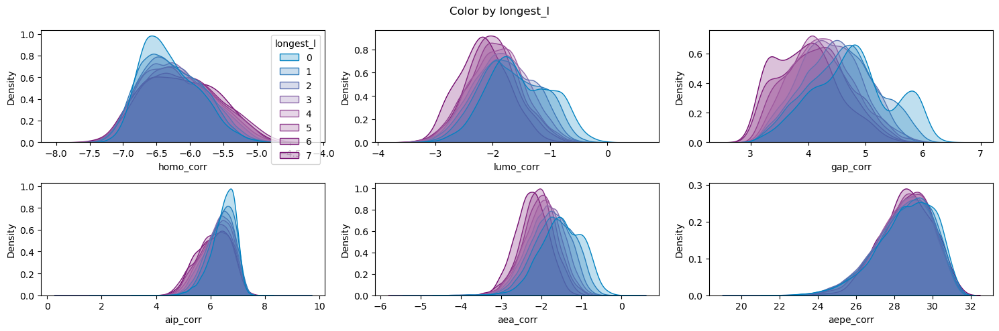

In [130]:
fig = plot_properties_hued_by(df.query(f'rings == 9'), hue,
                    palette=cmap,
                    common_norm=False,)

In [133]:
df['pie'] = df['smiles'].apply(get_pi_electron_from_smiles)

In [162]:
ne = df.query(f'rings == 9')['pie'].unique()
ne.sort()
ne

array([24, 26, 28, 30, 32, 34, 36, 38], dtype=int64)

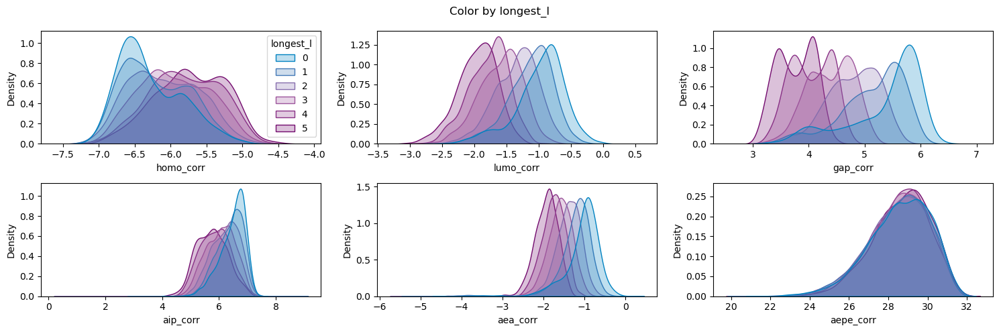

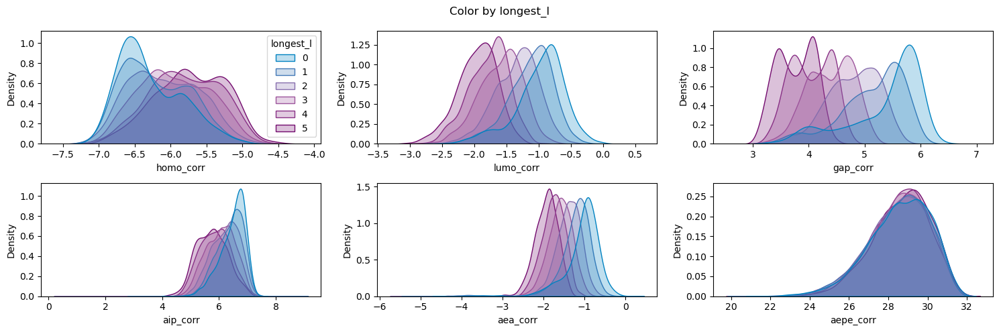

In [176]:
plot_properties_hued_by(df.query(f'rings == 9 and `pie` == 38 and longest_l <= 5'), 'longest_l',
                palette=cmap,
                common_norm=False,)

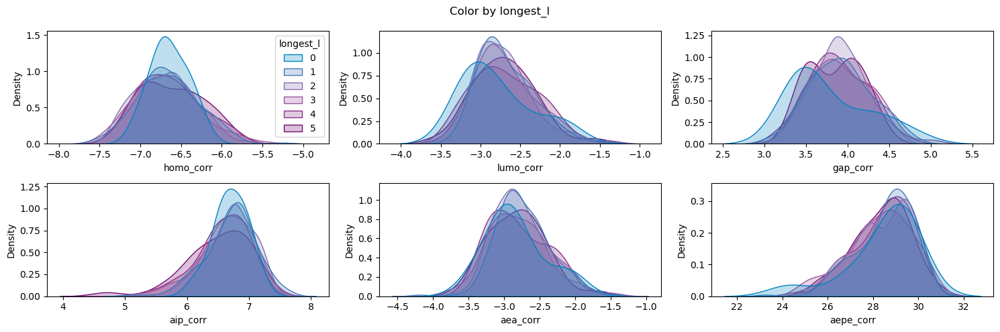

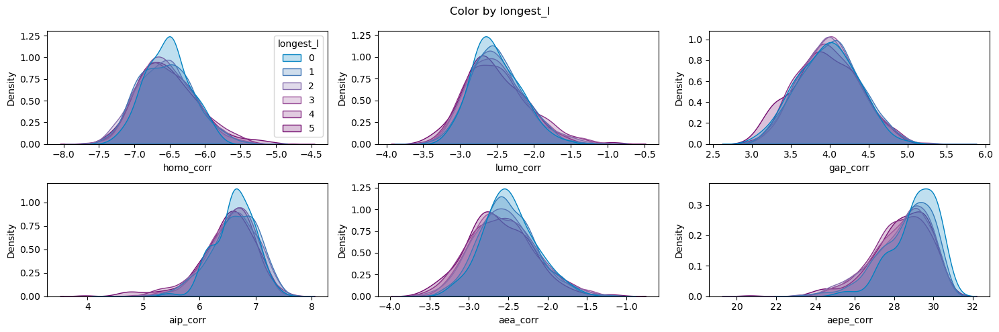

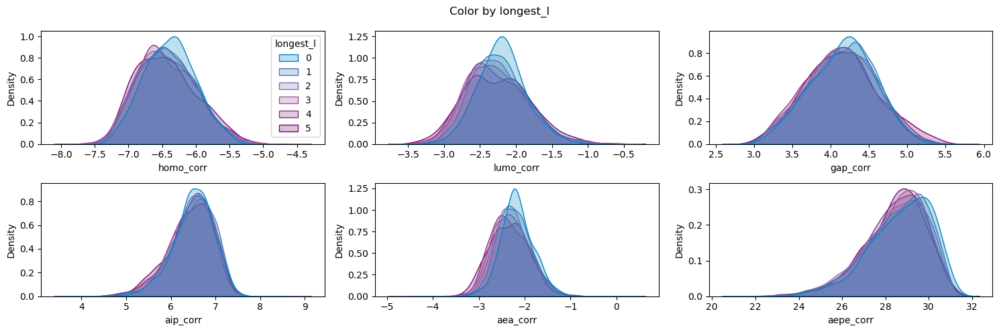

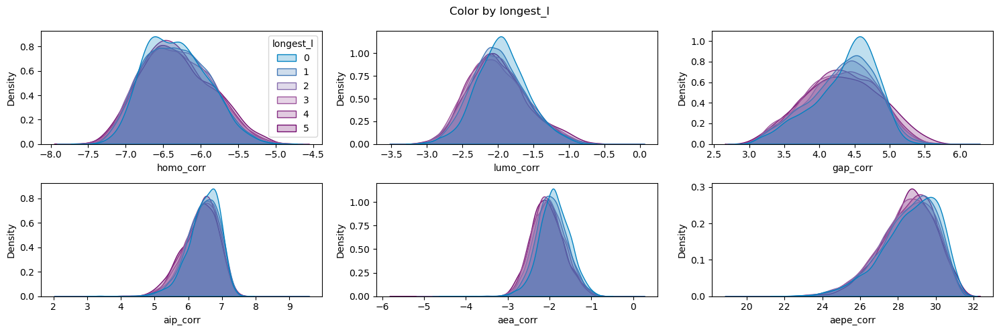

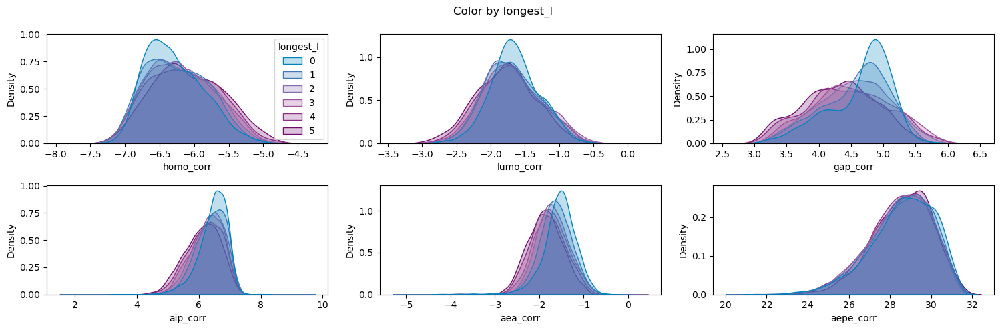

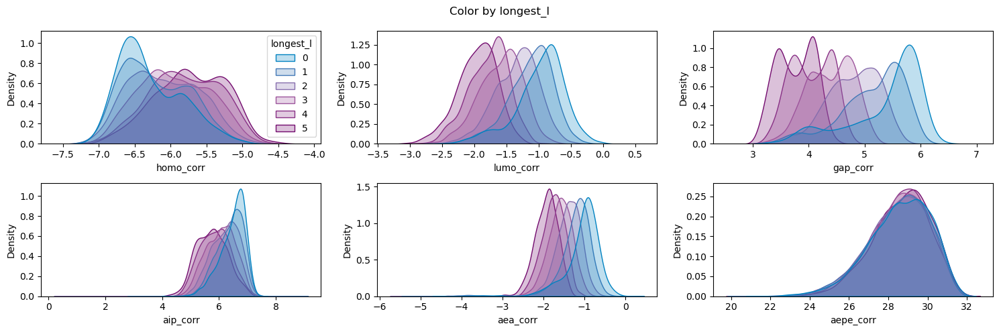

In [174]:
for e in ne[2:]:
    plot_properties_hued_by(df.query(f'rings == 9 and `pie` == {e} and longest_l <= 5'), 'longest_l',
                    palette=cmap,
                    common_norm=False,)

In [175]:
ne[-1]

38

In [165]:
df.query(f'rings == 9').longest_l.unique()

array([2, 1, 4, 0, 5, 3, 7, 6], dtype=int64)

In [232]:
df.query(f'rings == 9 and `longest_l` == {4} and pie > 26').shape

(7217, 59)

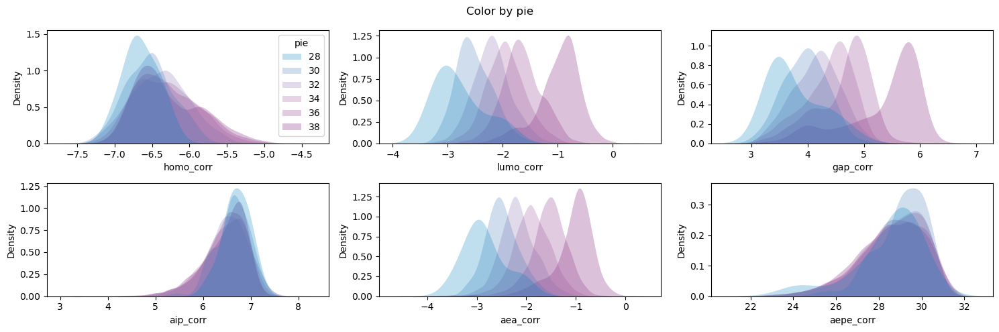

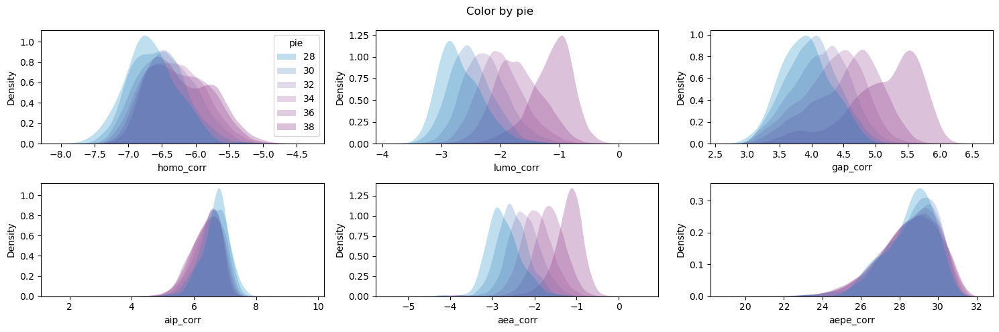

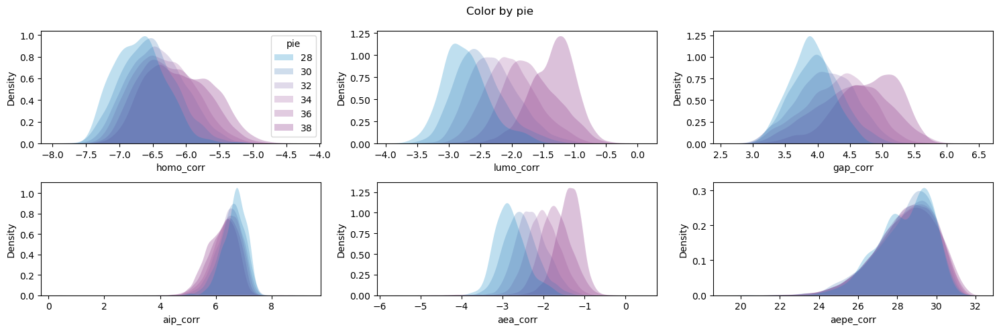

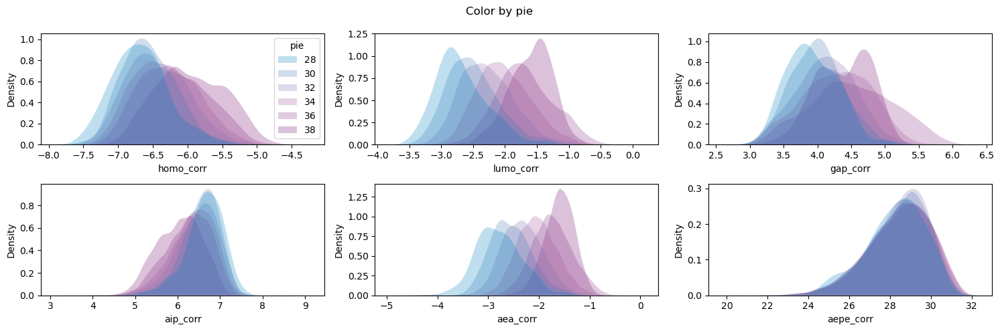

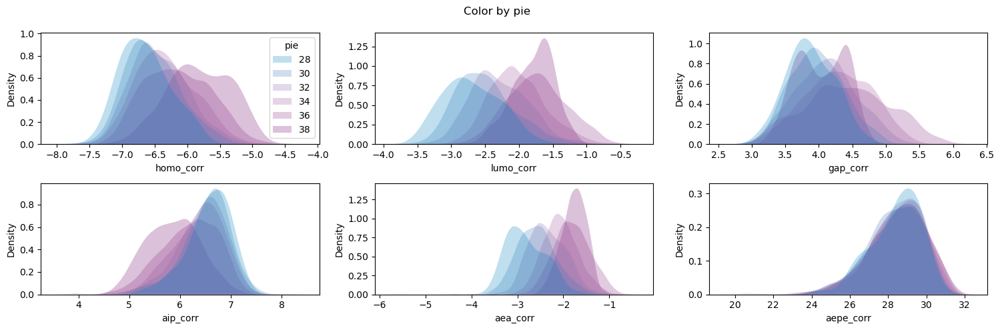

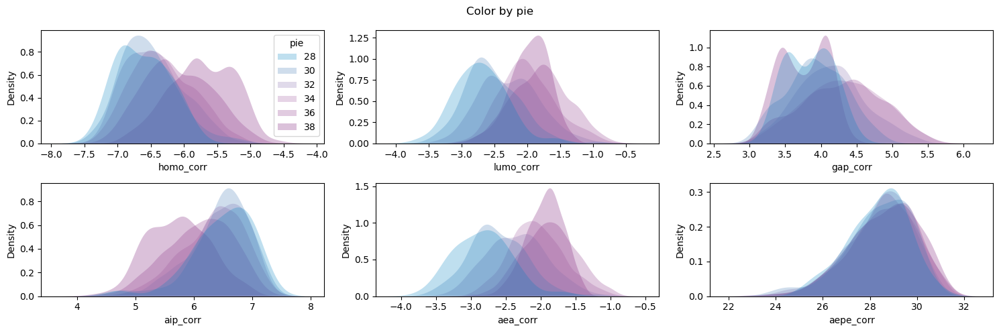

In [237]:
for e in [0,1,2,3,4,5]:
    plot_properties_hued_by(df.query(f'rings == 9 and `longest_l` == {e} and pie > 26'), 'pie',
                    palette=cmap,
                    edgecolor=None,
                    common_norm=False,)

In [195]:
rings = ['pyrrole', 'borole', 'furan', 'thiophene','dhdiborinine', '14diborinine', 'pyrazine', 'pyridine', 'borinine']
q = ''
for r in rings:
    q += f'`{r}` == 0 and '
q = q[:-4]

In [1]:
def plothist_properties_hued_by(dataset, hue, remove_legend=False, **kwargs):
    fig, axs = plt.subplots(2, 3, figsize=(15, 5))
    axs = axs.flatten()
    for i, prop in enumerate(props):
        sns.histplot(data=dataset, x=prop, 
                    fill=True,
                    hue=hue,
                    ax=axs[i],
                    **kwargs
                    )
        if remove_legend: axs[i].legend_.remove()
        remove_legend = True
    fig.suptitle(f"Color by {hue}")
    plt.tight_layout()
    return fig

In [2]:
ne = df.query(q).pie.unique()
ne.sort()

NameError: name 'df' is not defined

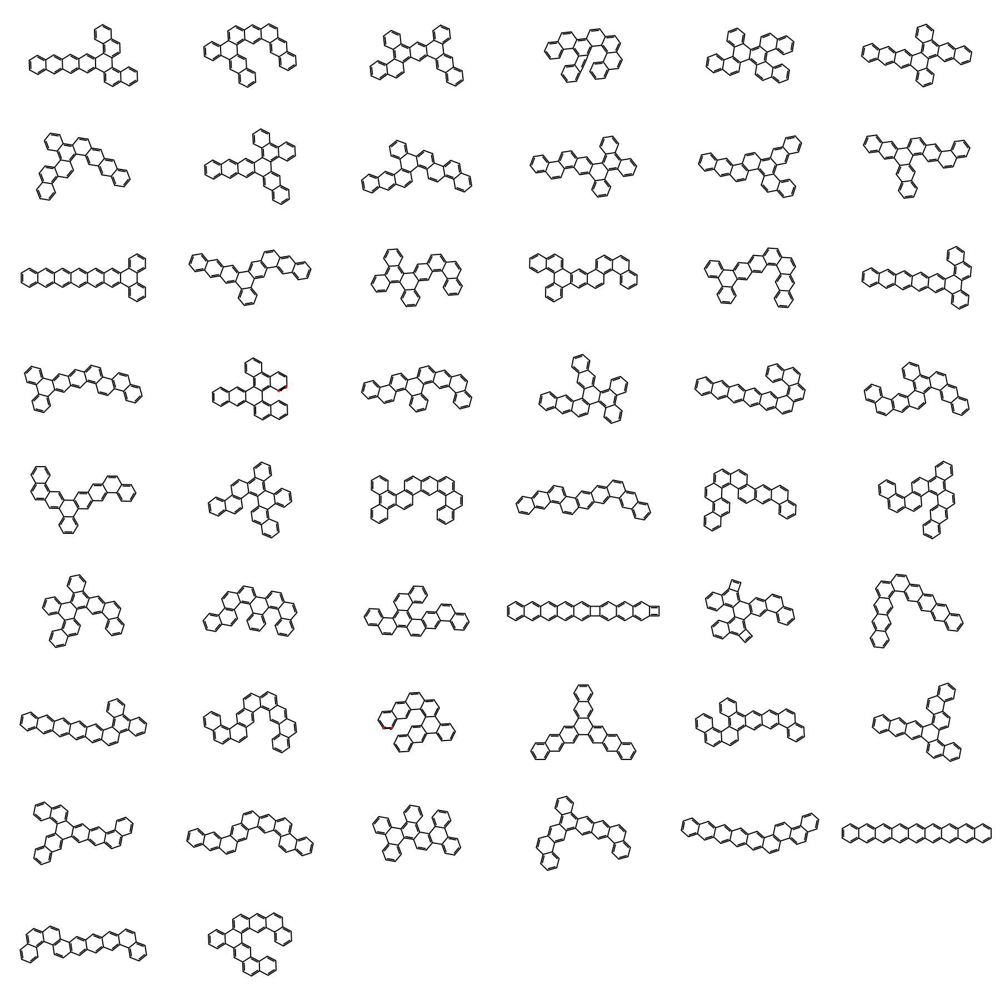

In [221]:
smis = df.query(f'rings > 4 and `pie` == 38 and {q}')['smiles']
Draw.MolsToGridImage([Chem.MolFromSmiles(smi) for smi in smis], molsPerRow=6, subImgSize=(300,200))

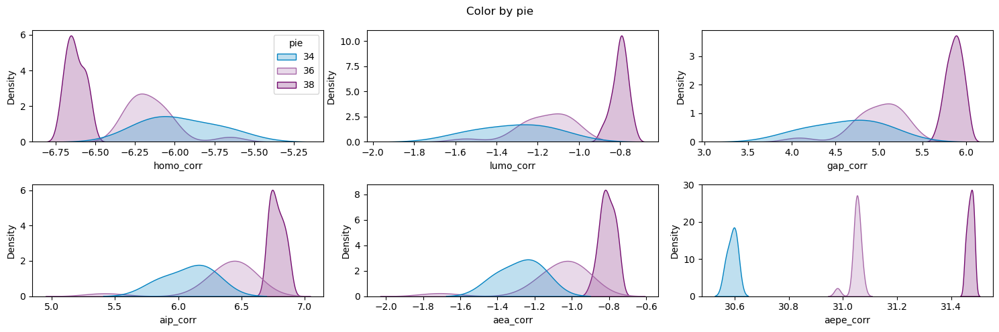

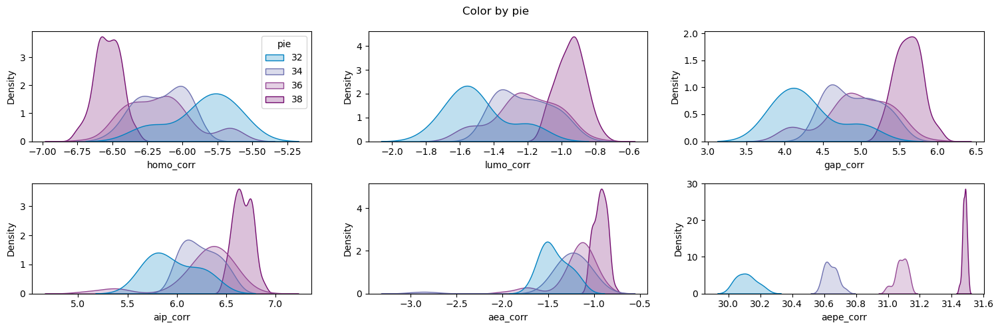

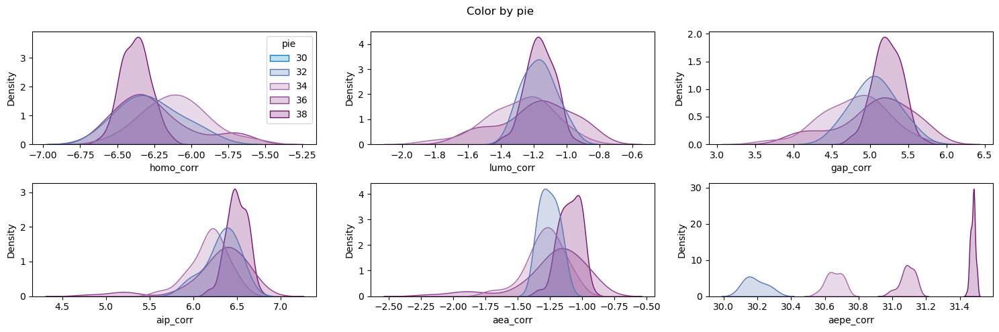

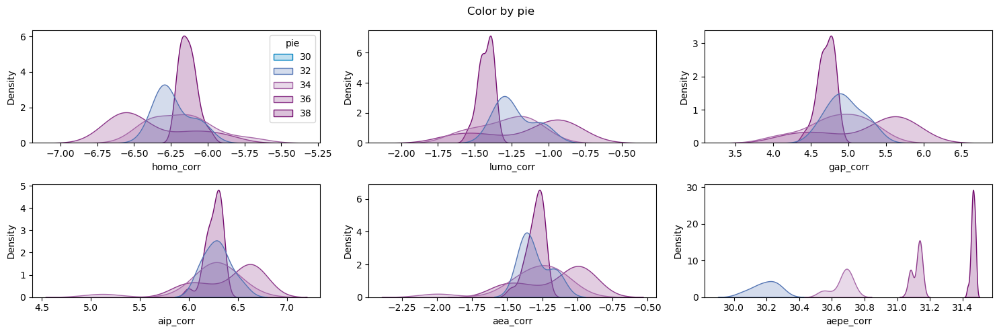

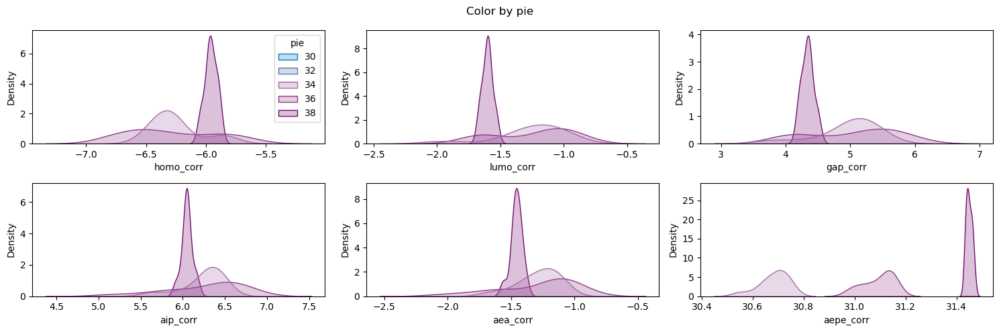

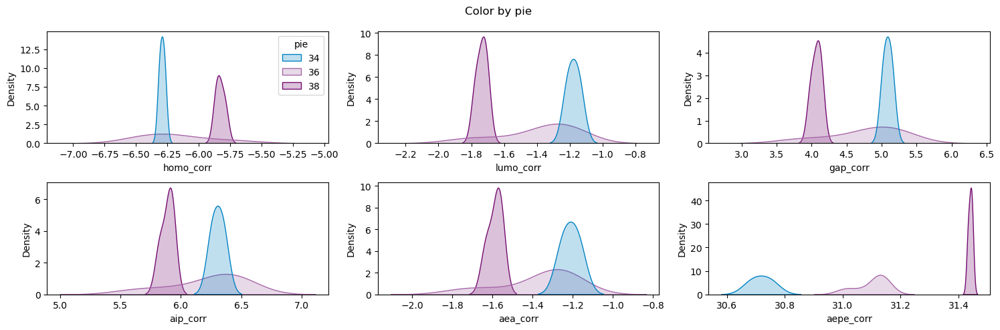

In [200]:
for e in [0,1,2,3,4,5]:
    plot_properties_hued_by(df.query(f'rings == 9 and `longest_l` == {e} and {q}'), 'pie',
                    palette=cmap,
                    common_norm=False,)

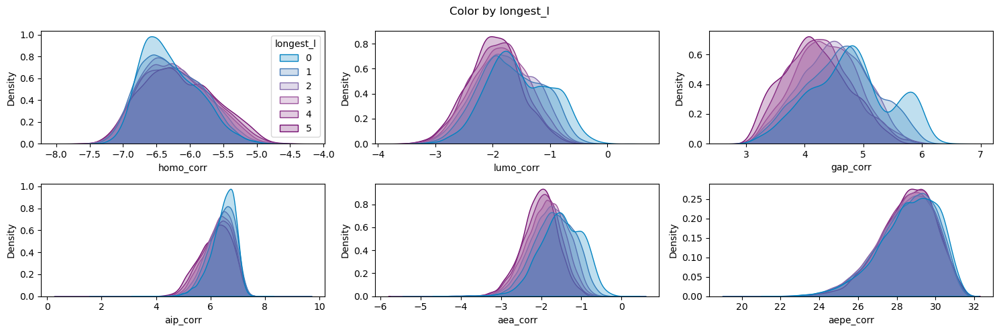

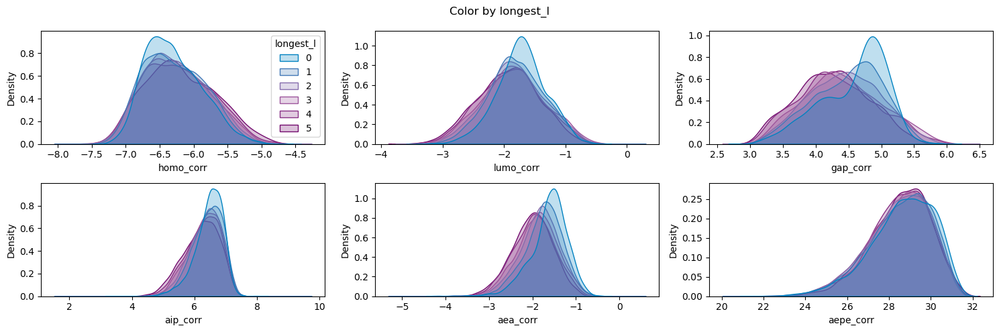

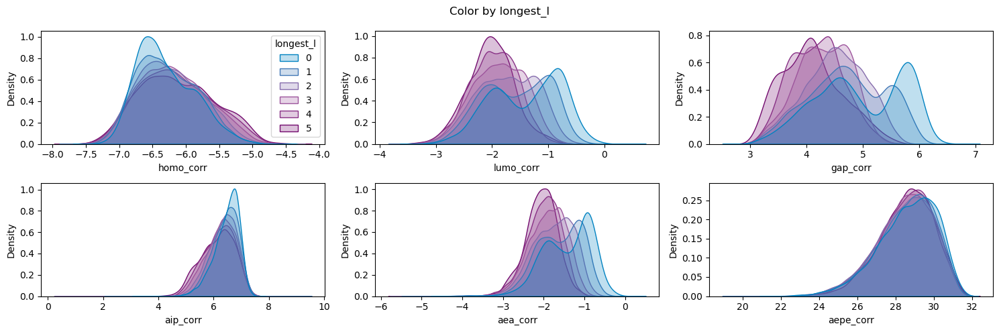

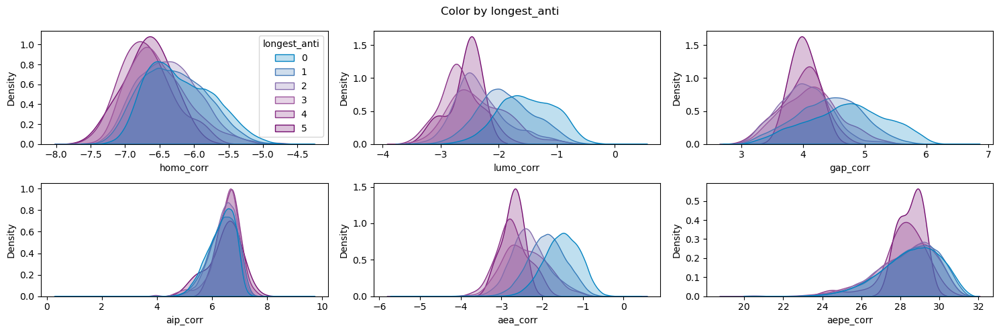

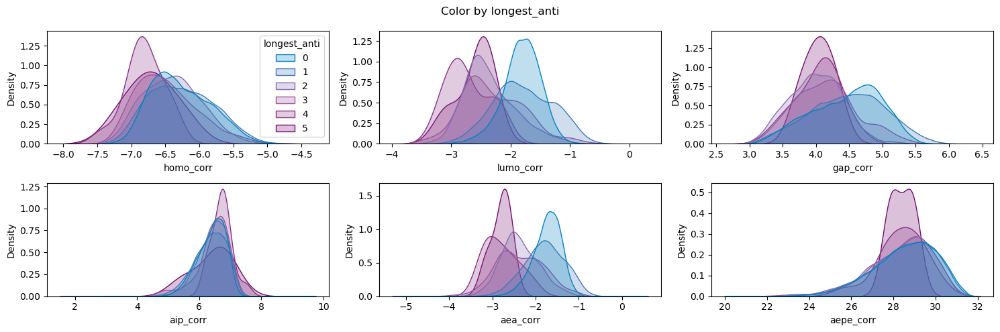

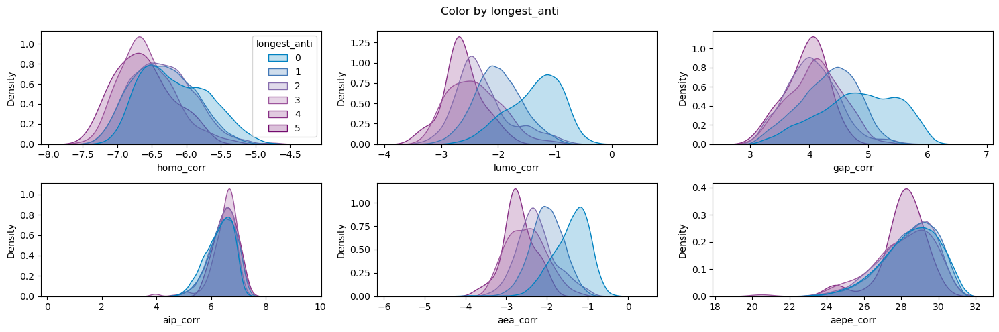

In [135]:
for hue in ['longest_l', 'longest_anti']:
    fig = plot_properties_hued_by(df.query(f'rings == 9 and `{hue}` <= 5 '), hue,
                    palette=cmap,
                    common_norm=False,)
    fig = plot_properties_hued_by(df.query(f'rings == 9 and huckel == False and `{hue}` <= 5'), hue,
                    palette=cmap,
                    common_norm=False,)    
    fig = plot_properties_hued_by(df.query(f'rings == 9 and huckel == True and `{hue}` <= 5'), hue,
                    palette=cmap,
                    common_norm=False,)   

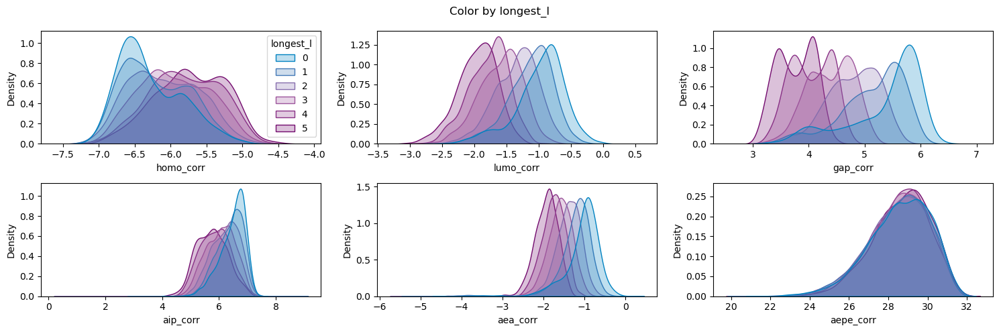

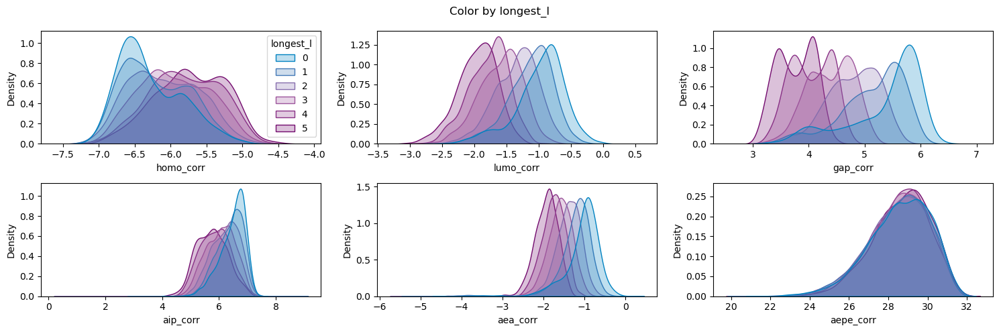

In [139]:
knockout = '`dhdiborinine` == 0 and `cyclobutadiene` == 0 and `borole` == 0'
for hue in ['longest_l']:
    fig = plot_properties_hued_by(df.query(f'rings == 9 and {knockout} and `{hue}` <= 5'), hue,
                    palette=cmap,
                    common_norm=False,)
    # fig = plot_properties_hued_by(df.query(f'rings == 9 and huckel == False and {knockout} and `{hue}` >= 3'), hue,
    #                 palette=cmap,
    #                 common_norm=False,)    
    fig = plot_properties_hued_by(df.query(f'rings == 9 and huckel == True and {knockout} and `{hue}` <= 5'), hue,
                    palette=cmap,
                    common_norm=False,)   

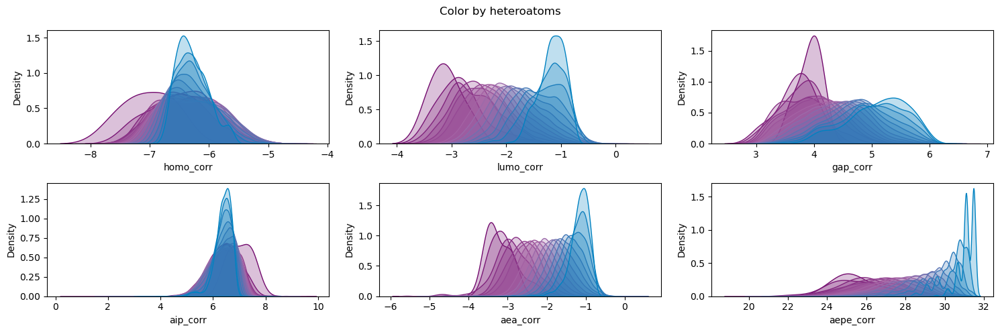

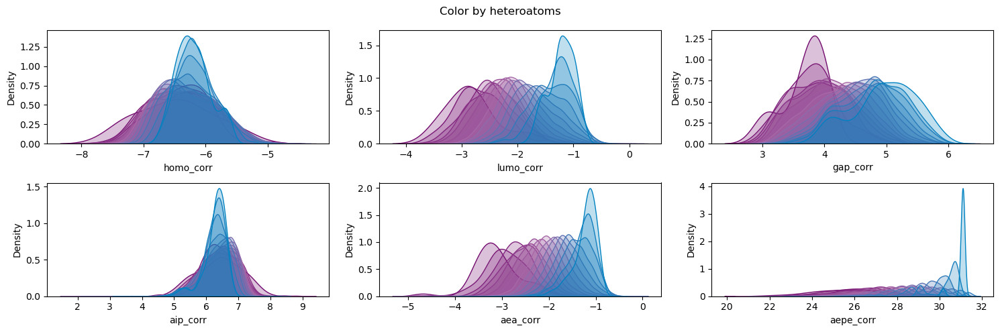

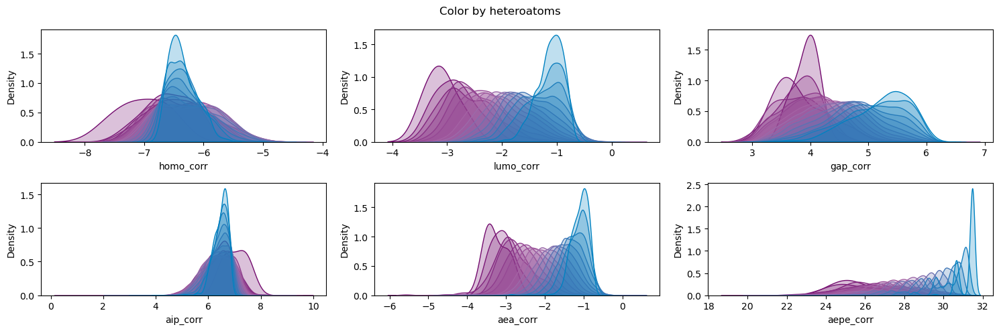

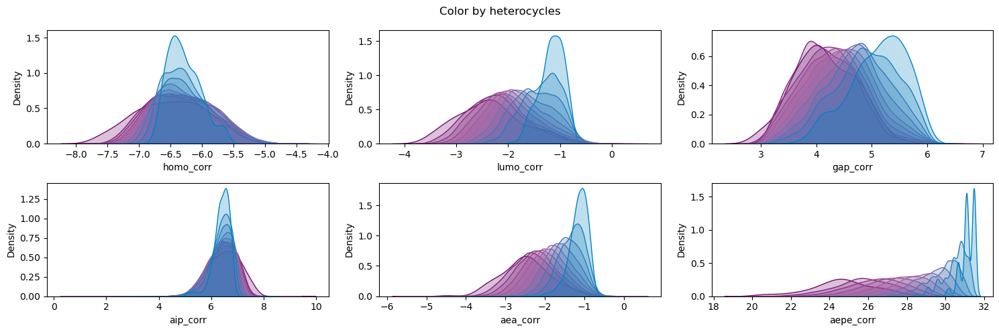

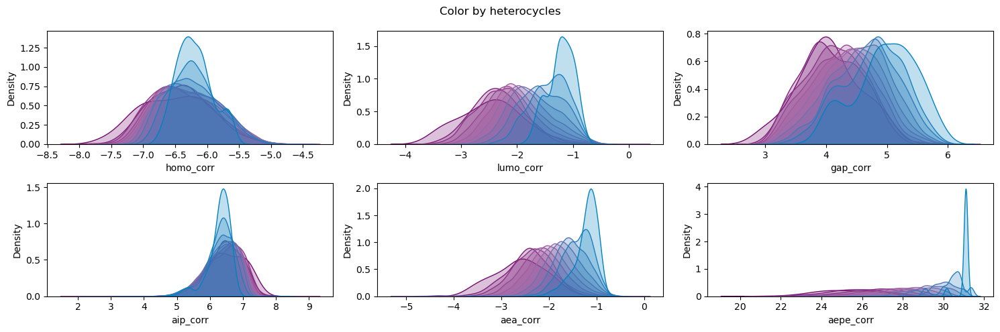

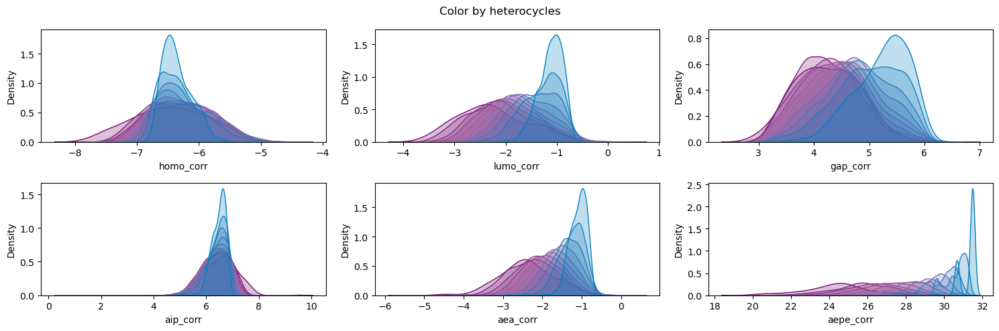

In [108]:
for hue in ['heteroatoms', 'heterocycles']:
    fig = plot_properties_hued_by(df.query('rings == 9'), hue,
                    remove_legend=True,
                    palette=cmap,
                    common_norm=False,)
    fig = plot_properties_hued_by(df.query('rings == 9 and huckel == False'), hue,
                    remove_legend=True,
                    palette=cmap,
                    common_norm=False,)    
    fig = plot_properties_hued_by(df.query('rings == 9 and huckel == True'), hue,
                    remove_legend=True,
                    palette=cmap,
                    common_norm=False,)   

<AxesSubplot: xlabel='homo_corr', ylabel='lumo_corr'>

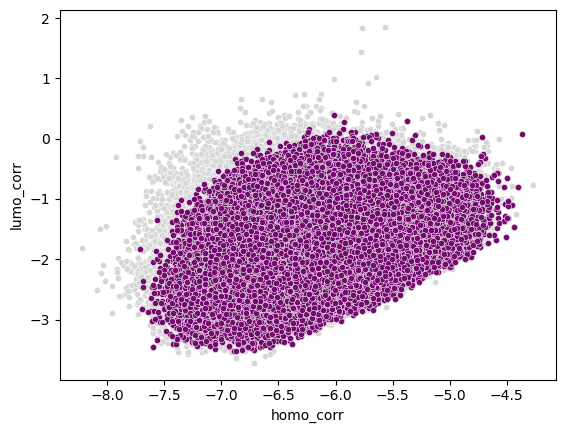

In [114]:
sns.scatterplot(data=df,
                x='homo_corr',y='lumo_corr',s=20,color='#d6d6d6')
sns.scatterplot(data=df.query('huckel == True and rings > 8'),
                x='homo_corr',y='lumo_corr',s=20,color='#730B6E')
sns.scatterplot(data=df.query('huckel == True and rings > 7'),
                x='homo_corr',y='lumo_corr',s=20,color='#730B6E')

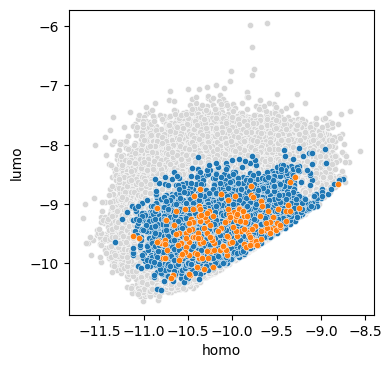

In [197]:
['longest_l', 'longest_a', 'longest_anti', 'longest_right', 'longest_left']

fig, ax = plt.subplots(1,1,figsize=(4,4))
sns.scatterplot(data=df,
                x='homo',y='lumo',s=20,color='#d6d6d6')

sns.scatterplot(data=df.query('longest_l == 6'),
                x='homo',y='lumo',s=20,)

sns.scatterplot(data=df.query('longest_l == 8'),
                x='homo',y='lumo',s=20,)

# square aspect
ax.set_aspect(1.0/ax.get_data_ratio(), adjustable='box')
plt.tight_layout()